<a href="https://colab.research.google.com/github/zxzhaixiang/GANstudy/blob/master/CityScape_seg2img.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

  Running setup.py bdist_wheel for gputil ... - done
  Stored in directory: /root/.cache/pip/wheels/17/0f/04/b79c006972335e35472c0b835ed52bfc0815258d409f560108
Successfully built gputil
  Running setup.py bdist_wheel for humanize ... - \ done
  Stored in directory: /root/.cache/pip/wheels/69/86/6c/f8b8593bc273ec4b0c653d3827f7482bb2001a2781a73b7f44
Successfully built humanize
Gen RAM Free: 13.0 GB  | Proc size: 140.2 MB
GPU RAM Free: 11441MB | Used: 0MB | Util   0% | Total 11441MB


### set up google drive folder

In [0]:
#Load the Drive helper and mount
from google.colab import drive
import os
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
if (not os.path.isdir('/content/drive/My Drive/CityScape_models/')):
    os.mkdir('/content/drive/My Drive/CityScape_models/')

In [0]:
#download dataset
import zipfile
if (not os.path.exists('./cityscapes.zip')):
  !wget "https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/cityscapes.zip"
if (not os.path.isdir('./cityscapes')):
  zip_ref = zipfile.ZipFile('cityscapes.zip','r')
  zip_ref.extractall('cityscapes')
  zip_ref.close()

--2018-12-01 20:22:34--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/cityscapes.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.189.73
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.189.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 279601602 (267M) [application/zip]
Saving to: ‘cityscapes.zip’

cityscapes.zip      100%[===================>] 266.65M  2.69MB/s    in 1m 42s  

2018-12-01 20:24:16 (2.61 MB/s) - ‘cityscapes.zip’ saved [279601602/279601602]



### Prepare libraries

In [0]:
!pip uninstall Pillow
!pip install Pillow==4.1.1
!pip3 install http://download.pytorch.org/whl/cu92/torch-0.4.1-cp36-cp36m-linux_x86_64.whl
!pip3 install torchvision
!pip3 install torchsummary


Uninstalling Pillow-4.0.0:
  Would remove:
    /usr/local/bin/createfontdatachunk.py
    /usr/local/bin/enhancer.py
    /usr/local/bin/explode.py
    /usr/local/bin/gifmaker.py
    /usr/local/bin/painter.py
    /usr/local/bin/pilconvert.py
    /usr/local/bin/pildriver.py
    /usr/local/bin/pilfile.py
    /usr/local/bin/pilfont.py
    /usr/local/bin/pilprint.py
    /usr/local/bin/player.py
    /usr/local/bin/thresholder.py
    /usr/local/bin/viewer.py
    /usr/local/lib/python3.6/dist-packages/PIL/*
    /usr/local/lib/python3.6/dist-packages/Pillow-4.0.0.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled Pillow-4.0.0
    100% |████████████████████████████████| 5.7MB 3.8MB/s 
    100% |████████████████████████████████| 512.6MB 27.7MB/s 
tcmalloc: large alloc 1073750016 bytes == 0x58032000 @  0x7f130623c2a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
import numpy as np
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.autograd import Variable
from torchvision import transforms
import time
import sys
import random
from skimage import io
from torchsummary import summary as PyTorchSummary
from collections import namedtuple
from PIL import ImageEnhance
from IPython.display import HTML, display
import pickle
import random

%matplotlib inline

In [0]:
print('# of files under trainA %d' % len(os.listdir('./cityscapes/cityscapes/trainA')))
print('# of files under trainB %d' % len(os.listdir('./cityscapes/cityscapes/trainB')))
print('# of files under testA %d' % len(os.listdir('./cityscapes/cityscapes/testA')))
print('# of files under testB %d' % len(os.listdir('./cityscapes/cityscapes/testB')))


# of files under trainA 2975
# of files under trainB 2975
# of files under testA 500
# of files under testB 500


In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
Seed = 123
batch_size = 4

print('Device is ', device)

Device is  cuda


### prepare data loader

In [0]:
class LoadCityScapeDataset(Dataset):
    '''
    prepare dataset for data loader

    INPUT
    dataset_name: name of the dataset
    dataset_type: 'train' or 'test'
    n: number of output

    OUTPUT
    conventional dataset along with .stats attribute which contains useful summary stats used in computing rsquared
    '''
    def __init__(self, dataset_name, dataset_type='train', seed = 123, transform = None,  N = -1):       
        self.rootpath = './cityscapes/'
        self.A_path = os.path.join(self.rootpath,dataset_name,dataset_type+'A/')
        self.B_path = os.path.join(self.rootpath,dataset_name,dataset_type+'B/')
        
        self.A_file_list = os.listdir(self.A_path)
        self.B_file_list = os.listdir(self.B_path)
        self.A_file_list.sort()
        self.B_file_list.sort()
        self.label_colors, self.label_list = self.Labels()
        self.nC = self.label_colors.shape[0]
        n = len(self.A_file_list)
        
        if (N!=-1 and N<=n):
            ind_new_list = random.sample(range(n),N)
            self.A_file_list = [self.A_file_list[i] for i in ind_new_list]
            self.B_file_list = [self.B_file_list[i] for i in ind_new_list]

        self.transform = transform

    def loadImg(self,imgpath):
        image = io.imread(imgpath)
        if self.transform:
            image = self.transform(image)
        image = image*2.0-1.0 #shift center to zero
        return image
    
    def loadLabelImg(self,imgpath):
        label_image_raw = io.imread(imgpath)
        #labels = np.argmin(np.array([np.square(label_image_raw-c).sum(axis=2) for c in self.label_colors]),axis=0)
        #labeled_image = (np.arange(self.nC) == labels[...,None]).astype(float)
        #image = torch.tensor(labeled_image.transpose((2,0,1)))        
        #return image, torch.tensor(labels), label_image_raw
        if self.transform:
            image = self.transform(label_image_raw)
        image = image*2.0-1.0 #shift center to zero
        return image
        
    def __getitem__(self, index):
        imgA = self.loadImg(os.path.join(self.A_path, self.A_file_list[index]))
        imgB = self.loadLabelImg(os.path.join(self.B_path, self.B_file_list[index]))
        if (random.random()<0.5):#random horizontal flip
          imgA, imgB = torch.flip(imgA,[2]), torch.flip(imgB, [2])
        return imgA, imgB
        
    def __len__(self):
        return len(self.A_file_list)
      
    def Labels(self):
      

        Label = namedtuple( 'Label' , [

            'name'        , # The identifier of this label, e.g. 'car', 'person', ... .
                            # We use them to uniquely name a class

            'id'          , # An integer ID that is associated with this label.
                            # The IDs are used to represent the label in ground truth images
                            # An ID of -1 means that this label does not have an ID and thus
                            # is ignored when creating ground truth images (e.g. license plate).
                            # Do not modify these IDs, since exactly these IDs are expected by the
                            # evaluation server.

            'trainId'     , # Feel free to modify these IDs as suitable for your method. Then create
                            # ground truth images with train IDs, using the tools provided in the
                            # 'preparation' folder. However, make sure to validate or submit results
                            # to our evaluation server using the regular IDs above!
                            # For trainIds, multiple labels might have the same ID. Then, these labels
                            # are mapped to the same class in the ground truth images. For the inverse
                            # mapping, we use the label that is defined first in the list below.
                            # For example, mapping all void-type classes to the same ID in training,
                            # might make sense for some approaches.
                            # Max value is 255!

            'category'    , # The name of the category that this label belongs to

            'categoryId'  , # The ID of this category. Used to create ground truth images
                            # on category level.

            'hasInstances', # Whether this label distinguishes between single instances or not

            'ignoreInEval', # Whether pixels having this class as ground truth label are ignored
                            # during evaluations or not

            'color'       , # The color of this label
            ] )

        labels = [
              #       name                     id    trainId   category            catId     hasInstances   ignoreInEval   color
              Label(  'unlabeled'            ,  0 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
              Label(  'ego vehicle'          ,  1 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
              Label(  'rectification border' ,  2 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
              Label(  'out of roi'           ,  3 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
              Label(  'static'               ,  4 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
              Label(  'dynamic'              ,  5 ,      255 , 'void'            , 0       , False        , True         , (111, 74,  0) ),
              Label(  'ground'               ,  6 ,      255 , 'void'            , 0       , False        , True         , ( 81,  0, 81) ),
              Label(  'road'                 ,  7 ,        0 , 'flat'            , 1       , False        , False        , (128, 64,128) ),
              Label(  'sidewalk'             ,  8 ,        1 , 'flat'            , 1       , False        , False        , (244, 35,232) ),
              Label(  'parking'              ,  9 ,      255 , 'flat'            , 1       , False        , True         , (250,170,160) ),
              Label(  'rail track'           , 10 ,      255 , 'flat'            , 1       , False        , True         , (230,150,140) ),
              Label(  'building'             , 11 ,        2 , 'construction'    , 2       , False        , False        , ( 70, 70, 70) ),
              Label(  'wall'                 , 12 ,        3 , 'construction'    , 2       , False        , False        , (102,102,156) ),
              Label(  'fence'                , 13 ,        4 , 'construction'    , 2       , False        , False        , (190,153,153) ),
              Label(  'guard rail'           , 14 ,      255 , 'construction'    , 2       , False        , True         , (180,165,180) ),
              Label(  'bridge'               , 15 ,      255 , 'construction'    , 2       , False        , True         , (150,100,100) ),
              Label(  'tunnel'               , 16 ,      255 , 'construction'    , 2       , False        , True         , (150,120, 90) ),
              Label(  'pole'                 , 17 ,        5 , 'object'          , 3       , False        , False        , (153,153,153) ),
              Label(  'polegroup'            , 18 ,      255 , 'object'          , 3       , False        , True         , (153,153,153) ),
              Label(  'traffic light'        , 19 ,        6 , 'object'          , 3       , False        , False        , (250,170, 30) ),
              Label(  'traffic sign'         , 20 ,        7 , 'object'          , 3       , False        , False        , (220,220,  0) ),
              Label(  'vegetation'           , 21 ,        8 , 'nature'          , 4       , False        , False        , (107,142, 35) ),
              Label(  'terrain'              , 22 ,        9 , 'nature'          , 4       , False        , False        , (152,251,152) ),
              Label(  'sky'                  , 23 ,       10 , 'sky'             , 5       , False        , False        , ( 70,130,180) ),
              Label(  'person'               , 24 ,       11 , 'human'           , 6       , True         , False        , (220, 20, 60) ),
              Label(  'rider'                , 25 ,       12 , 'human'           , 6       , True         , False        , (255,  0,  0) ),
              Label(  'car'                  , 26 ,       13 , 'vehicle'         , 7       , True         , False        , (  0,  0,142) ),
              Label(  'truck'                , 27 ,       14 , 'vehicle'         , 7       , True         , False        , (  0,  0, 70) ),
              Label(  'bus'                  , 28 ,       15 , 'vehicle'         , 7       , True         , False        , (  0, 60,100) ),
              Label(  'caravan'              , 29 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0, 90) ),
              Label(  'trailer'              , 30 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0,110) ),
              Label(  'train'                , 31 ,       16 , 'vehicle'         , 7       , True         , False        , (  0, 80,100) ),
              Label(  'motorcycle'           , 32 ,       17 , 'vehicle'         , 7       , True         , False        , (  0,  0,230) ),
              Label(  'bicycle'              , 33 ,       18 , 'vehicle'         , 7       , True         , False        , (119, 11, 32) ),
              Label(  'license plate'        , -1 ,       -1 , 'vehicle'         , 7       , False        , True         , (  0,  0,142) ),
          ]
        label_colors = np.array([list(l.color) for l in labels])
        label_list = [l.name for l in labels]
        return label_colors, label_list


In [0]:
Train_data = LoadCityScapeDataset('cityscapes',dataset_type='train',
                transform = transforms.Compose([
                             #transforms.RandomHorizontalFlip(),
                             transforms.ToTensor(),
                             ]))
Test_data = LoadCityScapeDataset('cityscapes',dataset_type='test', N = 200,
                transform = transforms.Compose([
                             #transforms.RandomHorizontalFlip(),
                             transforms.ToTensor(),
                             ]))

In [0]:
Train_loader = DataLoader(dataset=Train_data,
                          batch_size=batch_size, 
                          shuffle=False)
Test_loader = DataLoader(dataset=Test_data,
                          batch_size=batch_size, 
                          shuffle=False)

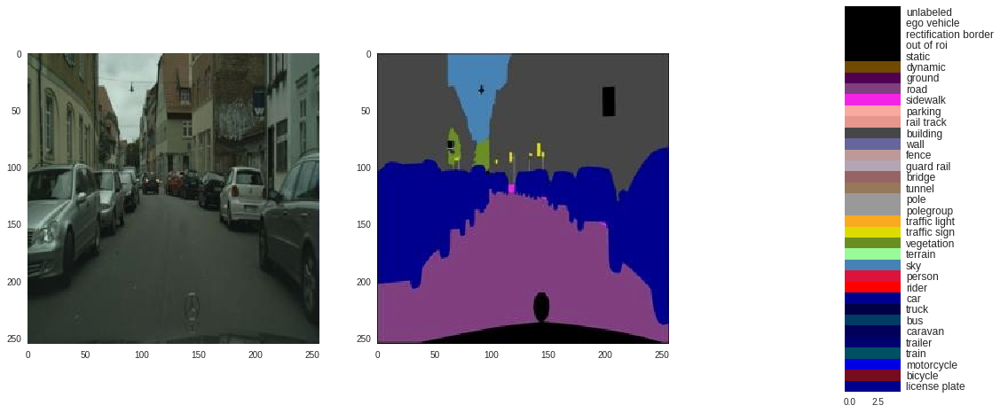

In [0]:
A, B = Train_data.__getitem__(100)
from matplotlib.colors import LinearSegmentedColormap
colors = Train_data.label_colors/255.0
label_list = Train_data.label_list
cm = LinearSegmentedColormap.from_list(
        'cityscapes', colors, N=colors.shape[0])

fig = plt.figure(figsize=(20,8))
plt.subplot(131)
plt.imshow(0.5+0.5*A.numpy().transpose((1,2,0)))
plt.grid('off')
plt.subplot(132)
plt.imshow(0.5+0.5*B.numpy().transpose((1,2,0)))
plt.grid('off')
#plt.subplot(143)
#plt.imshow(B_label[0].numpy(),cmap = cm, vmin = 0, vmax = len(label_list))
#plt.grid('off')
plt.subplot(133)
plt.imshow(np.repeat(np.array(range(colors.shape[0])).reshape((-1,1)),5,axis=1),cmap = cm)
plt.grid('off')
plt.yticks(range(colors.shape[0]), label_list, fontsize=12)
ax = plt.gca()
ax.yaxis.tick_right()
plt.show()


### Set up models

#### Encoder Generator

In [0]:
class Unet(nn.Module):
    def __init__(self):
        super(Unet, self).__init__()
        self.L1 = nn.Sequential(
            nn.Conv2d(3, 16, 4, padding = 1, stride=2), # 3x256x256 -> 16x127x127
            nn.LeakyReLU(0.2,True)
        ) # 3x256x256->16x128x128
        self.L2 = nn.Sequential(
            nn.Conv2d(16, 32, 4, padding = 1, stride=2), # 16x127x127 -> 32x62x62
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(32),
        ) #16x128x128->32x64x64
        self.L3 = nn.Sequential(
            nn.Conv2d(32, 64, 4, padding = 1, stride=2), # 32x62x62 -> 64x30x30
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(64)
        ) #32x64x64->64x32x32
        self.L4 = nn.Sequential(
            nn.Conv2d(64, 128, 4, padding = 1, stride=2), # 64x30x30 -> 128x14x14
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(128),
        ) #64x32x32->128x16x16
        self.L5 = nn.Sequential(
            nn.Conv2d(128, 128, 4, padding = 1, stride=2), # 128x14x14 -> 256x6x6
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(128),
        ) #128x16x16->256x8x8
        self.L6 = nn.Sequential(
            nn.Conv2d(128, 256, 4, padding = 1, stride=2), # 512x6x6 -> 512x2x2
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(256),
        ) #256x16x16->512x4x4
        self.L7 = nn.Sequential(
            nn.Conv2d(256, 512, 4),
            nn.LeakyReLU(0.2, True),
            nn.BatchNorm2d(512),
        ) #512x4x4->512x1x1
        
        self.DL1 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4), #256x6x6
            nn.ReLU(True),
            nn.BatchNorm2d(256),
            #nn.ConvTranspose2d(512, 512, 4, stride=2), #256x6x6
            #nn.Dropout(0.3)
        ) #512x1x1->512x4x4
        
        self.DL2 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, 4, padding = 1, stride=2), #128x14x14
            nn.ReLU(True),
            nn.BatchNorm2d(128),
            #nn.Dropout(0.3)
        ) #(512+512)x4x4->256x8x8
        
        self.DL3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, padding = 1, stride=2), #64x30x30
            nn.ReLU(True),
            nn.BatchNorm2d(128),
            #nn.Dropout(0.3)
        ) #(256+256)x8x8->128x16x16
        
        self.DL4 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, 4, padding = 1, stride=2), #32x62x62
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            #nn.Dropout(0.3)
        ) #(128+128)x64x64->64x32x32
        
        self.DL5 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, 4, padding = 1, stride=2), #16x127x127
            nn.ReLU(True),
            nn.BatchNorm2d(32),
            #nn.Dropout(0.3)
        ) # (64+64)x32x32-> 32x64x64
        
        self.DL6 = nn.Sequential(
            nn.ConvTranspose2d(64, 16, 4, padding = 1, stride=2), #16x256x256
            nn.ReLU(True),
            nn.BatchNorm2d(16),
            #nn.Dropout(0.3)
        ) # (32+32)x64x64 -> 16x128x128
        
        self.DL7 = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 4, padding = 1, stride=2), #16x256x256
            nn.ReLU(True),
            nn.BatchNorm2d(16),
            #nn.Dropout(0.3)
        ) # (16+16)x128x128 -> 16x256x256
        
        self.DL8 = nn.Sequential(
            nn.Conv2d(16, 3, 1), #3x256x256
            nn.Tanh()
        ) #16x62x62->3x256x256

    def attach(self,x1,x2):
      return torch.cat((x1,x2), 1)
    
    def forward(self, Input):
        L1_out  = self.L1(Input)
        L2_out  = self.L2(L1_out)
        L3_out  = self.L3(L2_out)
        L4_out  = self.L4(L3_out)
        L5_out  = self.L5(L4_out)
        L6_out  = self.L6(L5_out)
        L7_out  = self.L7(L6_out)
        DL1_out = self.DL1(L7_out)
        DL2_out = self.DL2(self.attach(DL1_out, L6_out))
        DL3_out = self.DL3(self.attach(DL2_out, L5_out))
        DL4_out = self.DL4(self.attach(DL3_out, L4_out))
        DL5_out = self.DL5(self.attach(DL4_out, L3_out))
        DL6_out = self.DL6(self.attach(DL5_out, L2_out))
        DL7_out = self.DL7(self.attach(DL6_out, L1_out))
        DL8_out = self.DL8(DL7_out)
        return DL8_out

In [0]:
class Unet2(nn.Module):
    def __init__(self):
        super(Unet2, self).__init__()
        self.L1 = nn.Sequential(
            nn.Conv2d(3, 32, 4, padding = 1, stride=2), # 3x256x256 -> 64x128x128
            nn.LeakyReLU(0.2,True)
        ) # 3x256x256->16x128x128
        self.L2 = nn.Sequential(
            nn.Conv2d(32, 64, 4, padding = 1, stride=2), # 64x128x128 -> 128x64x64
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(64),
        ) #16x128x128->32x64x64
        self.L3 = nn.Sequential(
            nn.Conv2d(64, 128, 4, padding = 1, stride=2), # 128x64x64 -> 256x32x32
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(128)
        ) #32x64x64->64x32x32
        self.L4 = nn.Sequential(
            nn.Conv2d(128, 256, 4, padding = 1, stride=2), # 256x32x32 -> 512x16x16
            nn.LeakyReLU(0.2,True), 
            nn.BatchNorm2d(256),
        ) #64x32x32->128x16x16
        self.L5 = nn.Sequential(
            nn.Conv2d(256, 512, 4, padding = 1, stride=2), # 512x16x16 -> 512x8x8
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(512),
        ) #128x16x16->256x8x8
        self.L6 = nn.Sequential(
            nn.Conv2d(512, 512, 4, padding = 1, stride=2), # 512x8x8 -> 512x4x4
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(512),
        ) #256x16x16->512x4x4
        self.L7 = nn.Sequential(
            nn.Conv2d(512, 512, 4),  #512x4x4->512x1x1
            nn.LeakyReLU(0.2, True),
            nn.BatchNorm2d(512),
        ) #512x4x4->512x1x1
        
        self.DL1 = nn.Sequential(
            nn.ConvTranspose2d(512, 512, 4), #512x4x4
            nn.ReLU(True),
            nn.BatchNorm2d(512),
            #nn.ConvTranspose2d(512, 512, 4, stride=2), #256x6x6
            nn.Dropout(0.3)
        ) #512x1x1->512x4x4
        
        self.DL2 = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, 4, padding = 1, stride=2), #->512x8x8
            nn.ReLU(True),
            nn.BatchNorm2d(512),
            nn.Dropout(0.3)
        ) #(512+512)x4x4->256x8x8
        
        self.DL3 = nn.Sequential(
            nn.ConvTranspose2d(1024, 256, 4, padding = 1, stride=2), #->512x16x16
            nn.ReLU(True),
            nn.BatchNorm2d(256),
            nn.Dropout(0.3)
        ) #(256+256)x8x8->128x16x16
        
        self.DL4 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, 4, padding = 1, stride=2), #256x32x32
            nn.ReLU(True),
            nn.BatchNorm2d(128),
            #nn.Dropout(0.3)
        ) #(128+128)x64x64->64x32x32
        
        self.DL5 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, 4, padding = 1, stride=2), #128x64x64
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            #nn.Dropout(0.3)
        ) # (64+64)x32x32-> 32x64x64
        
        self.DL6 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, 4, padding = 1, stride=2), #64x128x128
            nn.ReLU(True),
            nn.BatchNorm2d(32),
            #nn.Dropout(0.3)
        ) # (32+32)x64x64 -> 16x128x128
        
        self.DL7 = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 4, padding = 1, stride=2), #32x256x256
            nn.ReLU(True),
            nn.BatchNorm2d(32),
            #nn.Dropout(0.3)
        ) # (16+16)x128x128 -> 16x256x256
        
        self.DL8 = nn.Sequential(
            nn.Conv2d(32, 3, 1), #3x256x256
            nn.Tanh()
        ) #16x62x62->3x256x256

    def attach(self,x1,x2):
      return torch.cat((x1,x2), 1)
    
    def forward(self, Input):
        L1_out  = self.L1(Input)
        L2_out  = self.L2(L1_out)
        L3_out  = self.L3(L2_out)
        L4_out  = self.L4(L3_out)
        L5_out  = self.L5(L4_out)
        L6_out  = self.L6(L5_out)
        L7_out  = self.L7(L6_out)
        DL1_out = self.DL1(L7_out)
        DL2_out = self.DL2(self.attach(DL1_out, L6_out))
        DL3_out = self.DL3(self.attach(DL2_out, L5_out))
        DL4_out = self.DL4(self.attach(DL3_out, L4_out))
        DL5_out = self.DL5(self.attach(DL4_out, L3_out))
        DL6_out = self.DL6(self.attach(DL5_out, L2_out))
        DL7_out = self.DL7(self.attach(DL6_out, L1_out))
        DL8_out = self.DL8(DL7_out)
        return DL8_out

In [0]:
G = Unet2().to(device)

In [0]:
PyTorchSummary(G, input_size = (3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]           1,568
         LeakyReLU-2         [-1, 32, 128, 128]               0
            Conv2d-3           [-1, 64, 64, 64]          32,832
         LeakyReLU-4           [-1, 64, 64, 64]               0
       BatchNorm2d-5           [-1, 64, 64, 64]             128
            Conv2d-6          [-1, 128, 32, 32]         131,200
         LeakyReLU-7          [-1, 128, 32, 32]               0
       BatchNorm2d-8          [-1, 128, 32, 32]             256
            Conv2d-9          [-1, 256, 16, 16]         524,544
        LeakyReLU-10          [-1, 256, 16, 16]               0
      BatchNorm2d-11          [-1, 256, 16, 16]             512
           Conv2d-12            [-1, 512, 8, 8]       2,097,664
        LeakyReLU-13            [-1, 512, 8, 8]               0
      BatchNorm2d-14            [-1, 51

In [0]:
tmp_x = torch.rand((16,3,256,256)).to(device)
tmp_y = G(tmp_x)
print("G converts shape ", tmp_x.shape, " into shape ", tmp_y.shape)

G converts shape  torch.Size([16, 3, 256, 256])  into shape  torch.Size([16, 3, 256, 256])


#### Discriminator

In [0]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.cnnlayers = nn.Sequential(
            nn.Conv2d(3, 16, 5, stride=2), # 3x256x256 -> 16x126x126
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2), # 16, 63, 63
            nn.Conv2d(16, 32, 5, stride=2), # 32, 30, 30
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2), # 32, 15, 15
            nn.Conv2d(32, 64, 5, stride=2),  # 64, 6, 6
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2), # 64, 3, 3
            nn.Conv2d(64, 256, 3, stride=1),  # 256x1x1
            nn.BatchNorm2d(256),
            nn.ReLU(True)   
        )
        self.fc = nn.Sequential(
            nn.Linear(256, 1),
            nn.Sigmoid())
    def forward(self,x):
        out = self.cnnlayers(x)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        return out

In [0]:
class PatchDiscriminator(nn.Module):
    def __init__(self):
        super(PatchDiscriminator, self).__init__()
        self.cnnlayers = nn.Sequential(
            nn.Conv2d(6, 16, 4, padding = 1, stride=2), # 3x256x256 ->16x128x128
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(16),
            nn.Conv2d(16, 32, 4, padding = 1, stride=2), # -> 32x64x64
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 64, 4, padding = 1, stride=2),  # -> 64x32x32
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, 4, padding = 1, stride=2),  # -> 128x16x16
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 256, 4, padding = 1, stride=2),  # -> 256x8x8
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(256),
            nn.Conv2d(256, 512, 4, padding = 1, stride=1),  # -> 512x7x7
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(512),
            nn.Conv2d(512, 128, 1),  # -> 128x7x7
            nn.LeakyReLU(0.2,True),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 1, 1, stride=1),  # 1x7x7
            nn.Sigmoid(),
            nn.AvgPool2d(7),
            #nn.MaxPool2d(8,stride=1)
        )
        self.fc = nn.Sequential(
            nn.Linear(1, 1),
            nn.Sigmoid())
    def forward(self,x, y):
        out = self.cnnlayers(torch.cat((x,y), 1))
        out = out.reshape(out.size(0),-1)
        out = self.fc(out)
        return out

In [0]:
D = PatchDiscriminator().to(device)

In [0]:
PyTorchSummary(D, input_size=[(3,256,256),(3,256,256)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,552
         LeakyReLU-2         [-1, 16, 128, 128]               0
       BatchNorm2d-3         [-1, 16, 128, 128]              32
            Conv2d-4           [-1, 32, 64, 64]           8,224
         LeakyReLU-5           [-1, 32, 64, 64]               0
       BatchNorm2d-6           [-1, 32, 64, 64]              64
            Conv2d-7           [-1, 64, 32, 32]          32,832
         LeakyReLU-8           [-1, 64, 32, 32]               0
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10          [-1, 128, 16, 16]         131,200
        LeakyReLU-11          [-1, 128, 16, 16]               0
      BatchNorm2d-12          [-1, 128, 16, 16]             256
           Conv2d-13            [-1, 256, 8, 8]         524,544
        LeakyReLU-14            [-1, 25

In [0]:
G_criterion = nn.L1Loss()
D_criterion = nn.BCELoss()
g_optimizer = torch.optim.Adam(G.parameters(), lr=0.001, betas=(0.5,0.999))
d_optimizer = torch.optim.Adam(D.parameters(), lr=0.0001, betas=(0.5,0.999))

In [0]:
G.load_state_dict(torch.load('/content/drive/My Drive/CityScape_models/largeG_model_wDropout'))
D.load_state_dict(torch.load('/content/drive/My Drive/CityScape_models/largeD_model_wDropout'))
train_glosses,train_dreallosses, train_dfakelosses, train_gdlosses, \
  train_hlosses, train_drealAcc, train_dfakeAcc, \
  test_losses, test_drealAcc, test_dfakeAcc = \
  pickle.load(open('/content/drive/My Drive/CityScape_models/losses_largeG_wDropout.p','rb'))
    

In [0]:
#G.load_state_dict(.load('/content/drive/My Drive/CityScape_models/G_model'))
#D.load_state_dict(torch.load('/content/drive/My Drive/CityScape_models/D_model'))

### Training

In [0]:
def lr_schedular(optimizer, epoch, opt_type = 'G'):
  if(epoch<10):
    lr = 0.001
  elif(epoch<30):
    lr = 0.0006
  elif (epoch<60):
    lr = 0.0004
  elif (epoch<80):
    lr = 0.0003
  else:
    lr = 0.0002
  
  if(opt_type=='D'):
    lr/=5.0
  print('learning rate = {}'.format(lr))
  
  for param_group in optimizer.param_groups:
    param_group['lr']=lr
    
  return optimizer

In [0]:
num_epochs = 300

train_len = Train_data.__len__()
test_len = Test_data.__len__()
print('{} training data available, {} test data available'.format(train_len, test_len))

2975 training data available, 200 test data available


In [0]:
train_glosses = []
train_dreallosses = []
train_dfakelosses = []
train_gdlosses = []
train_hlosses = []
train_drealAcc = []
train_dfakeAcc = []

test_losses = []
test_drealAcc = []
test_dfakeAcc = []


In [0]:
def reset_grad():
    d_optimizer.zero_grad()
    g_optimizer.zero_grad()

In [0]:
class progress():
  def __init__(self,max = 100):
    self.mrange = max
    self.pbar = display(self.progress(0,self.mrange), display_id = True)
    
  def update(self, i):
    self.pbar.update(self.progress(i,self.mrange))
    
  def progress(self,value, M=100):
    return HTML("""Training Mini Batch [{value}/{M}] <progress
            value='{value}'
            max='{M}',
            style='width: 80%'
        >
            90
        </progress>
          """.format(value=value,M=M))

learning rate = 4e-05
learning rate = 0.0002


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:62: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


epoch[171/300], G:3.43e-02, D(real):6.61e-02, D(fake):6.01e-02, D(G):5.18e-01, hybrid:4.208e-02, ACC:D(real):0.943, D(fake):0.920 | Test G:5.65e-02, ACC: D(real):0.425000, D(fake):1.000
learning rate = 4e-05
learning rate = 0.0002


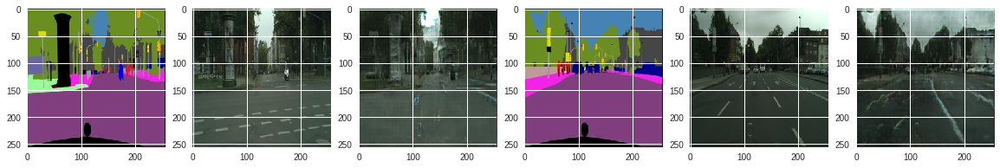

epoch[172/300], G:3.40e-02, D(real):6.17e-02, D(fake):5.49e-02, D(G):5.37e-01, hybrid:4.204e-02, ACC:D(real):0.957, D(fake):0.925 | Test G:5.69e-02, ACC: D(real):0.635000, D(fake):0.980
learning rate = 4e-05
learning rate = 0.0002


epoch[173/300], G:3.40e-02, D(real):6.13e-02, D(fake):5.78e-02, D(G):5.41e-01, hybrid:4.212e-02, ACC:D(real):0.958, D(fake):0.908 | Test G:5.76e-02, ACC: D(real):0.485000, D(fake):0.995
learning rate = 4e-05
learning rate = 0.0002


epoch[174/300], G:3.40e-02, D(real):5.95e-02, D(fake):5.46e-02, D(G):5.47e-01, hybrid:4.216e-02, ACC:D(real):0.963, D(fake):0.930 | Test G:5.71e-02, ACC: D(real):0.400000, D(fake):1.000
learning rate = 4e-05
learning rate = 0.0002


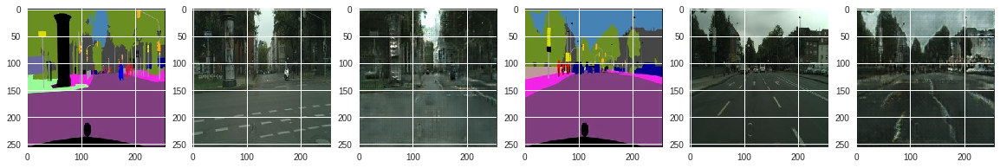

epoch[175/300], G:3.42e-02, D(real):6.44e-02, D(fake):5.95e-02, D(G):5.28e-01, hybrid:4.213e-02, ACC:D(real):0.947, D(fake):0.919 | Test G:5.96e-02, ACC: D(real):0.380000, D(fake):0.995
learning rate = 4e-05
learning rate = 0.0002


epoch[176/300], G:3.43e-02, D(real):6.35e-02, D(fake):5.85e-02, D(G):5.34e-01, hybrid:4.231e-02, ACC:D(real):0.950, D(fake):0.919 | Test G:5.70e-02, ACC: D(real):0.830000, D(fake):0.960
learning rate = 4e-05
learning rate = 0.0002


epoch[177/300], G:3.41e-02, D(real):6.20e-02, D(fake):5.33e-02, D(G):5.47e-01, hybrid:4.226e-02, ACC:D(real):0.950, D(fake):0.931 | Test G:5.70e-02, ACC: D(real):0.775000, D(fake):0.965
learning rate = 4e-05
learning rate = 0.0002


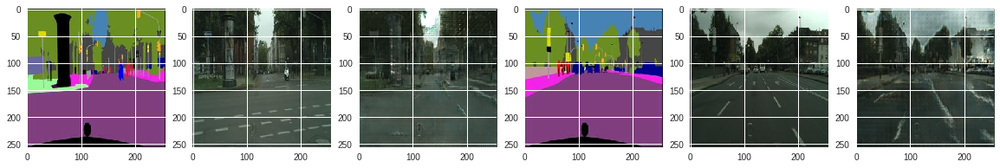

epoch[178/300], G:3.41e-02, D(real):6.15e-02, D(fake):5.49e-02, D(G):5.50e-01, hybrid:4.231e-02, ACC:D(real):0.952, D(fake):0.928 | Test G:5.64e-02, ACC: D(real):0.690000, D(fake):0.995
learning rate = 4e-05
learning rate = 0.0002


epoch[179/300], G:3.41e-02, D(real):6.44e-02, D(fake):5.70e-02, D(G):5.47e-01, hybrid:4.234e-02, ACC:D(real):0.949, D(fake):0.913 | Test G:5.82e-02, ACC: D(real):0.775000, D(fake):0.955
learning rate = 4e-05
learning rate = 0.0002


epoch[180/300], G:3.41e-02, D(real):6.32e-02, D(fake):5.92e-02, D(G):5.41e-01, hybrid:4.218e-02, ACC:D(real):0.949, D(fake):0.911 | Test G:5.77e-02, ACC: D(real):0.335000, D(fake):1.000
learning rate = 4e-05
learning rate = 0.0002


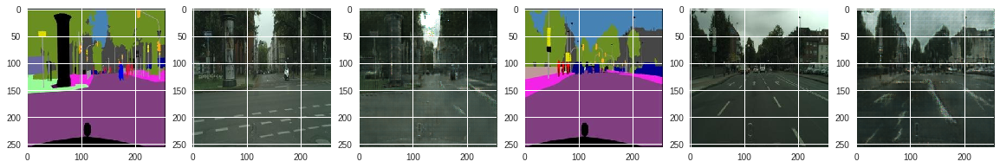

epoch[181/300], G:3.39e-02, D(real):6.12e-02, D(fake):5.66e-02, D(G):5.50e-01, hybrid:4.218e-02, ACC:D(real):0.954, D(fake):0.917 | Test G:5.71e-02, ACC: D(real):0.450000, D(fake):1.000
learning rate = 4e-05
learning rate = 0.0002


epoch[182/300], G:3.38e-02, D(real):6.00e-02, D(fake):5.25e-02, D(G):5.62e-01, hybrid:4.218e-02, ACC:D(real):0.958, D(fake):0.929 | Test G:5.73e-02, ACC: D(real):0.685000, D(fake):1.000
learning rate = 4e-05
learning rate = 0.0002


epoch[183/300], G:3.39e-02, D(real):5.63e-02, D(fake):5.20e-02, D(G):5.62e-01, hybrid:4.229e-02, ACC:D(real):0.973, D(fake):0.929 | Test G:5.71e-02, ACC: D(real):0.405000, D(fake):1.000
learning rate = 4e-05
learning rate = 0.0002


In [0]:
for epoch in range(170, num_epochs):
    train_gloss, train_dloss_real, train_dloss_fake, train_gdloss, train_hloss, test_loss = 0,0,0,0,0,0
    train_d_real_correct, train_d_fake_correct, test_d_real_correct, test_d_fake_correct = 0,0,0,0
    
    d_optimizer = lr_schedular(d_optimizer, epoch, opt_type='D')
    g_optimizer = lr_schedular(g_optimizer, epoch)
    
    pbar = progress(Train_loader.__len__())
    for i, (y,x) in enumerate(Train_loader):
        pbar.update(i+1)
        
        #x+=torch.rand(x.shape)*0.1
        #torch.clamp(x,-1.0,1.0,out=x)
        x, y = x.to(device), y.to(device)
        yhat = G(x)

        g_loss = G_criterion(yhat, y)
        
        d_real = D(x,y)
        d_fake = D(x,yhat)
        tmp_batch_size = x.shape[0]
        real_labels = torch.ones((tmp_batch_size,1)).to(device)
        fake_labels = torch.zeros((tmp_batch_size,1)).to(device)
        
        #if(i%2==0):
        d_loss_real = D_criterion(d_real, real_labels)
        d_loss_fake = D_criterion(d_fake, fake_labels)

        d_loss = 0.1*d_loss_real + 0.1*d_loss_fake
        reset_grad()
        d_loss.backward(retain_graph=True)
        d_optimizer.step()

        gd_loss = D_criterion(d_fake, real_labels)
        hybrid_loss = g_loss + 0.015*gd_loss
        reset_grad()
        hybrid_loss.backward()
        g_optimizer.step()
        
        train_d_real_correct+= (d_real>0.5).sum().item()
        train_d_fake_correct += (d_fake<0.5).sum().item()
        train_gloss += g_loss.item()
        train_dloss_real += d_loss_real.item()
        train_dloss_fake += d_loss_fake.item()
        train_gdloss += gd_loss.item()
        train_hloss += hybrid_loss.item()
        

    if(epoch%3==0):    
        plt.figure(figsize=(20,9))
        plt.subplot(161)
        plt.imshow(0.5+0.5*x[-1].detach().cpu().numpy().transpose([1,2,0]))
        plt.subplot(162)
        plt.imshow(0.5+0.5*y[-1].detach().cpu().numpy().transpose([1,2,0]))
        plt.subplot(163)
        plt.imshow(0.5+0.5*yhat[-1].detach().cpu().numpy().transpose([1,2,0]))

    for i, (y,x) in enumerate(Test_loader):
        x, y = x.to(device), y.to(device)
        yhat = G(x)
        loss = G_criterion(yhat,y)
        test_loss+=loss.data[0]
        d_real = D(x,y)
        d_fake = D(x,yhat)
        test_d_real_correct += (d_real>0.5).sum().item()
        test_d_fake_correct += (d_fake<0.5).sum().item()

    if(epoch%3==0):    
        plt.subplot(164)
        plt.imshow(0.5+0.5*x[-1].detach().cpu().numpy().transpose([1,2,0]))
        plt.subplot(165)
        plt.imshow(0.5+0.5*y[-1].detach().cpu().numpy().transpose([1,2,0]))
        plt.subplot(166)
        plt.imshow(0.5+0.5*yhat[-1].detach().cpu().numpy().transpose([1,2,0]))
        plt.show()

    train_d_real_correct /= train_len
    train_d_fake_correct /= train_len
    train_gloss          /= train_len
    train_dloss_real     /= train_len
    train_dloss_fake     /= train_len
    train_gdloss         /= train_len
    train_hloss          /= train_len
    test_loss            /= test_len
    test_d_real_correct  /= test_len
    test_d_fake_correct  /= test_len
    
    train_glosses.append(train_gloss)
    train_dreallosses.append(train_dloss_real)
    train_dfakelosses.append(train_dloss_fake)
    train_gdlosses.append(train_gdloss)
    train_hlosses.append(train_hloss)
    train_drealAcc.append(train_d_real_correct)
    train_dfakeAcc.append(train_d_fake_correct)
    test_losses.append(test_loss)
    test_drealAcc.append(test_d_real_correct)
    test_dfakeAcc.append(test_d_fake_correct)

    if(epoch%5==0):
        torch.save(G.state_dict(), '/content/drive/My Drive/CityScape_models/largeG_model_wDropout')
        torch.save(D.state_dict(), '/content/drive/My Drive/CityScape_models/largeD_model_wDropout')
        pickle.dump([train_glosses,train_dreallosses, train_dfakelosses, 
            train_gdlosses, train_hlosses, train_drealAcc, train_dfakeAcc,
            test_losses, test_drealAcc, test_dfakeAcc], 
            open('/content/drive/My Drive/CityScape_models/losses_largeG_wDropout.p','wb'))

    print('epoch[{}/{}], G:{:.2e}, D(real):{:.2e}, D(fake):{:.2e}, D(G):{:.2e}, hybrid:{:.3e}, ACC:D(real):{:.3f}, D(fake):{:.3f} | Test G:{:.2e}, ACC: D(real):{:3f}, D(fake):{:.3f}'.
          format(epoch+1, num_epochs, train_gloss, train_dloss_real, train_dloss_fake, train_gdloss, train_hloss,
                train_d_real_correct, train_d_fake_correct,
                test_loss, test_d_real_correct, test_d_fake_correct))

Text(0.5,0,'epoch')

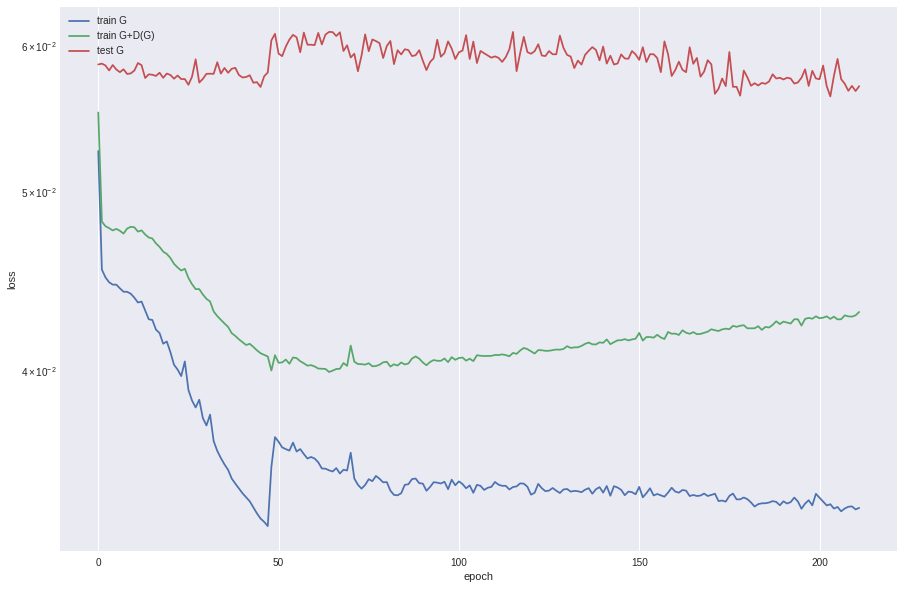

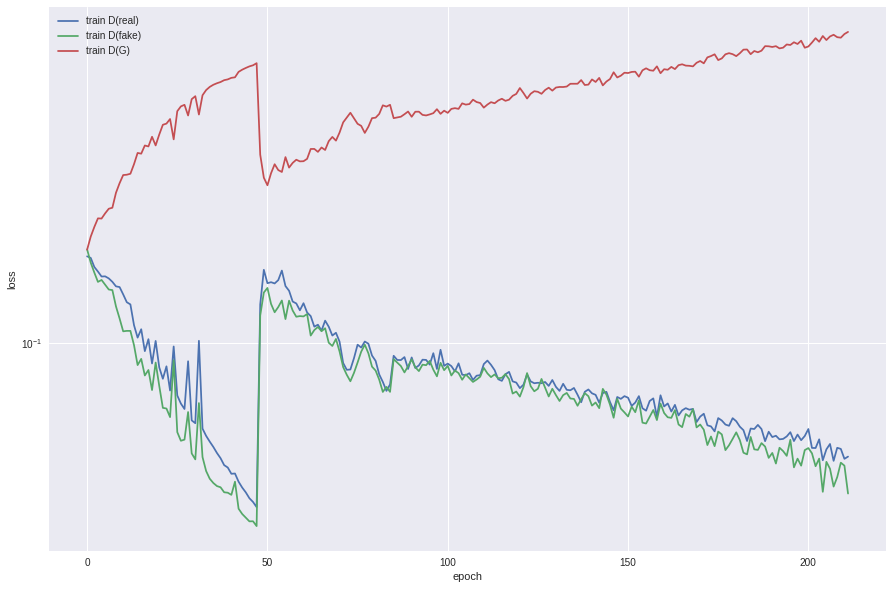

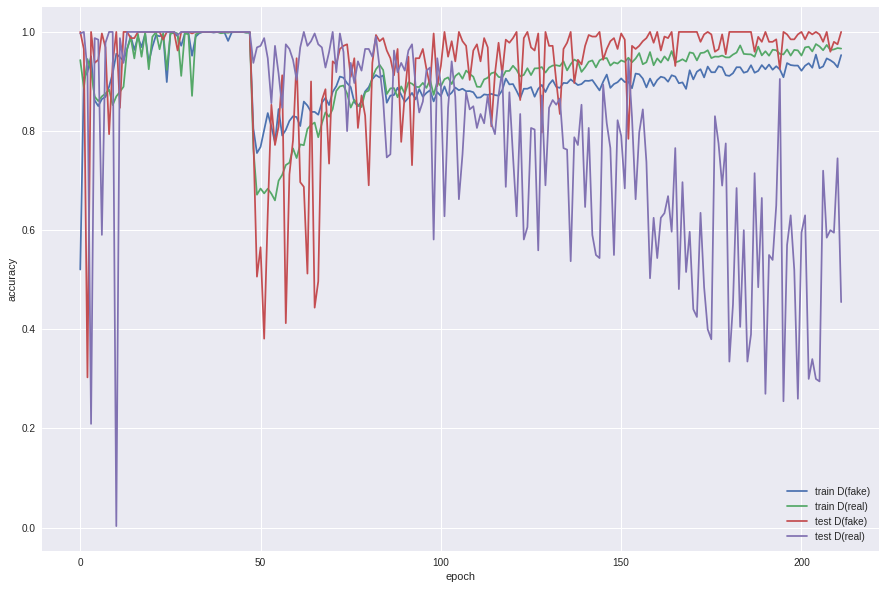

In [0]:
plt.figure(figsize=(15,10))
plt.plot(train_glosses, label='train G')
plt.plot(train_hlosses, label='train G+D(G)')
plt.plot(test_losses, label='test G')
plt.yscale('log')
plt.legend()
plt.ylabel('loss')

plt.xlabel('epoch')


plt.figure(figsize=(15,10))
plt.plot(train_dreallosses, label='train D(real)')
plt.plot(train_dfakelosses, label='train D(fake)')
plt.plot(train_gdlosses, label='train D(G)')
plt.yscale('log')
plt.legend()
plt.ylabel('loss')
plt.xlabel('epoch')

    
plt.figure(figsize=(15,10))
plt.plot(train_dfakeAcc, label='train D(fake)')
plt.plot(train_drealAcc, label='train D(real)')
plt.plot(test_dfakeAcc, label='test D(fake)')
plt.plot(test_drealAcc, label='test D(real)')
plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epoch')

Batch 0


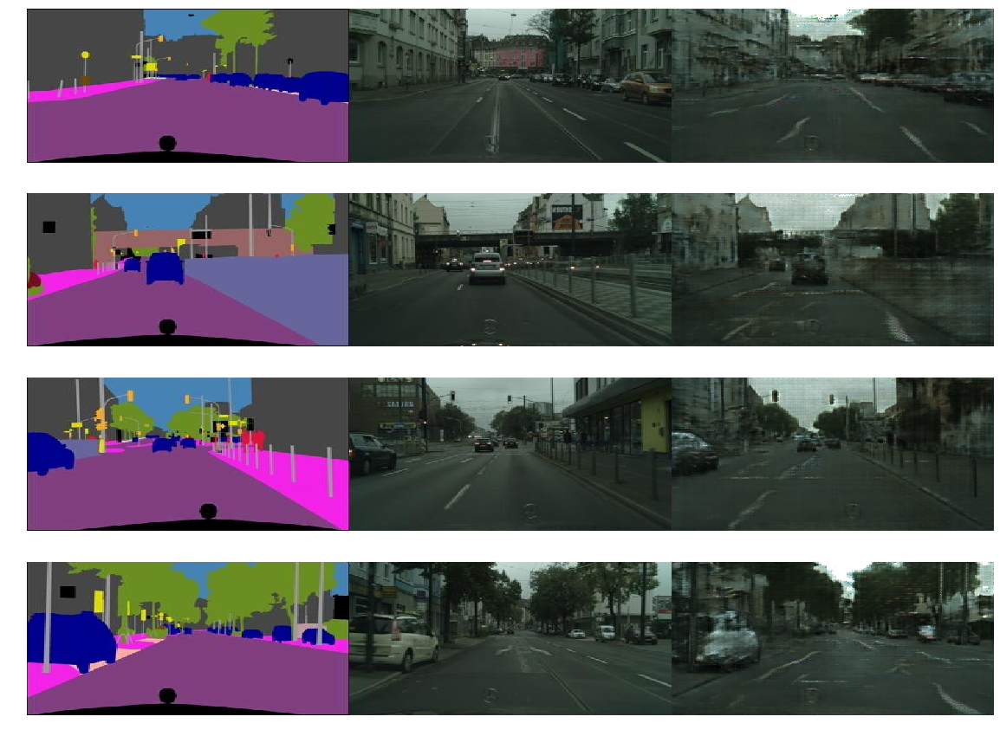

Batch 1


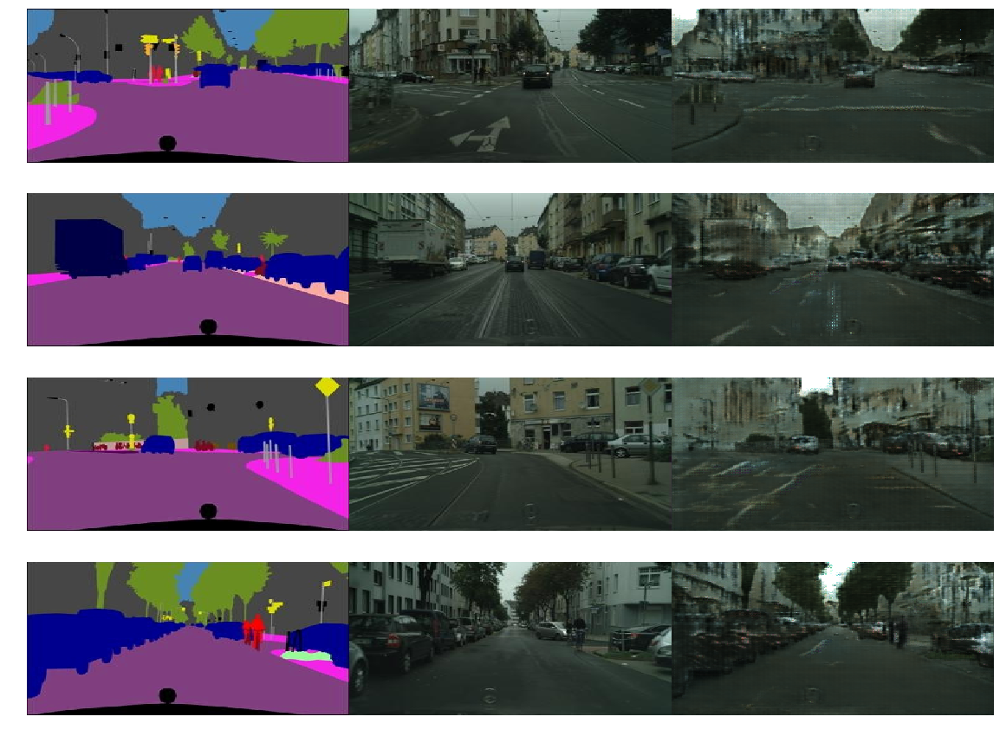

Batch 2


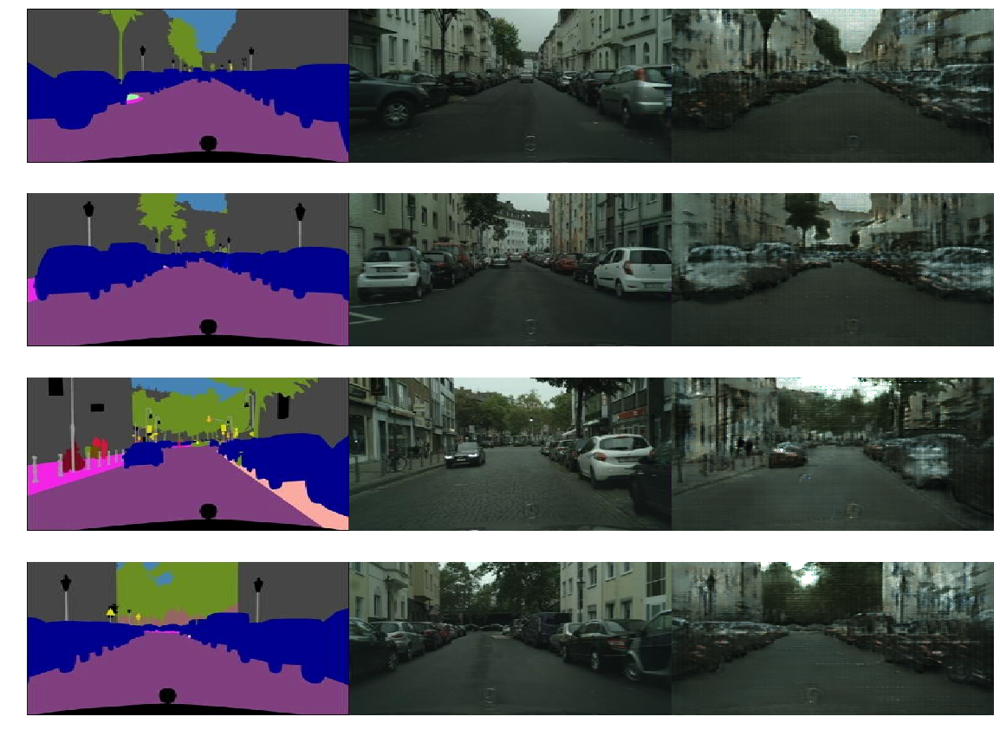

Batch 3


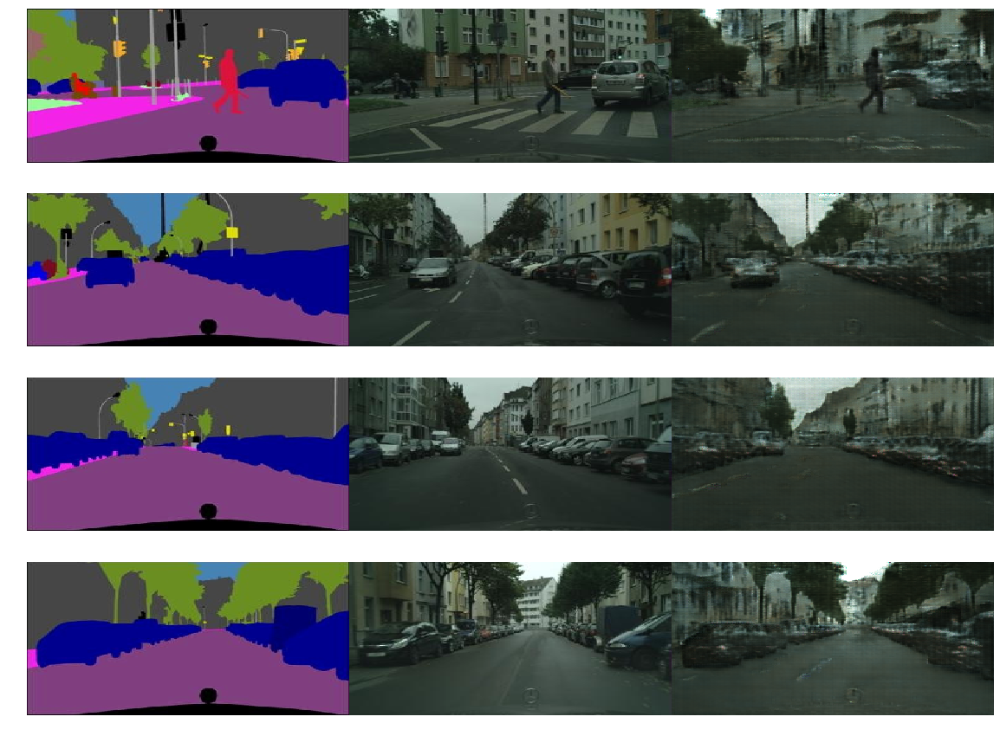

In [0]:
for i, (y,x) in enumerate(Train_loader):
    xtrain, ytrain = x.to(device), y.to(device)
    ytrainhat = G(xtrain)
    xtrain = xtrain.detach().cpu().numpy().transpose((0,2,3,1))
    ytrain = ytrain.detach().cpu().numpy().transpose((0,2,3,1))
    ytrainhat = ytrainhat.detach().cpu().numpy().transpose((0,2,3,1))
    print("Batch {}".format(i))

    plt.figure(figsize=(20,15))
    for k in range(4):
        plt.subplot(4,1,k+1)
        plt.imshow(0.5+0.5*np.concatenate((xtrain[k], ytrain[k], ytrainhat[k]),axis=1))
        plt.axis('tight')
        plt.axis('off')
    plt.show()
    if(i>2):
      break

Batch 0


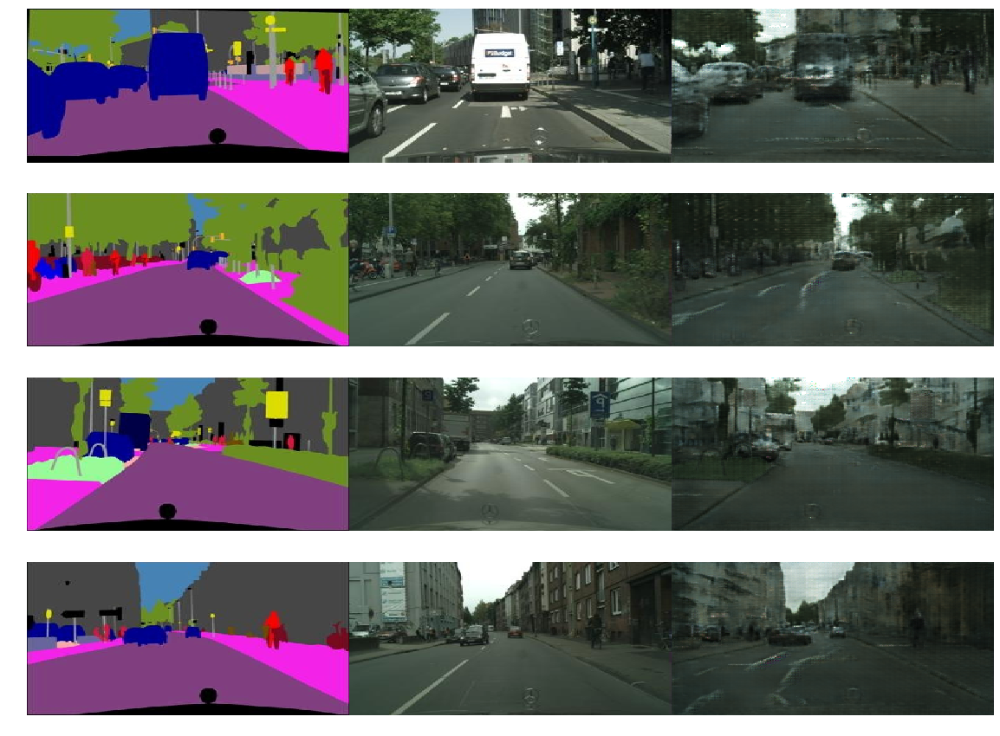

Batch 1


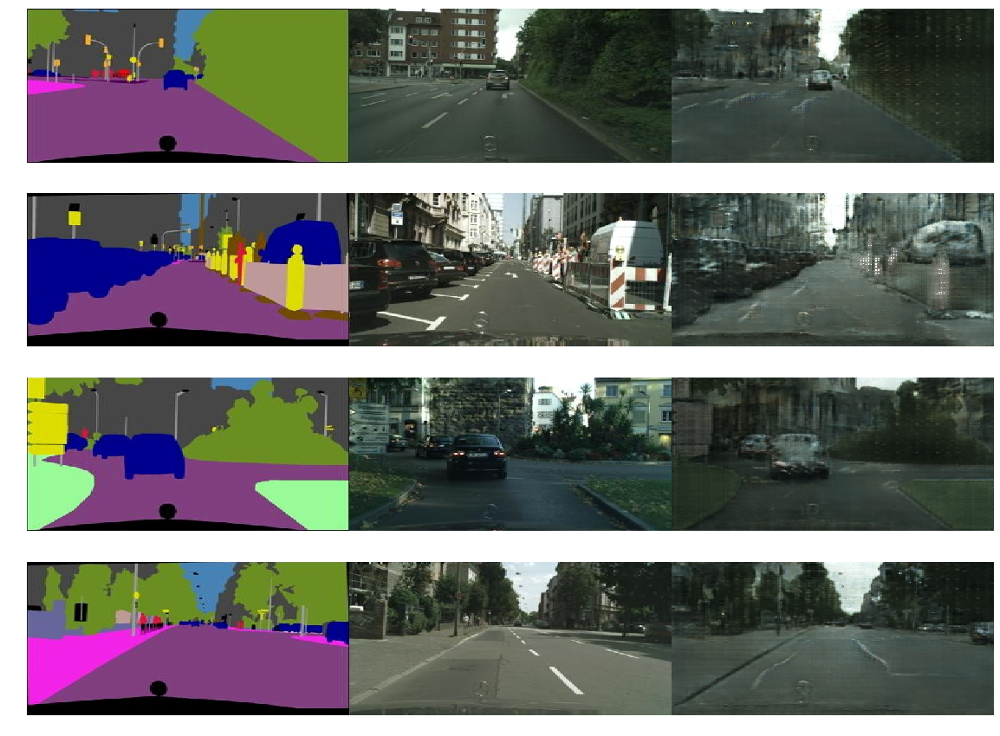

Batch 2


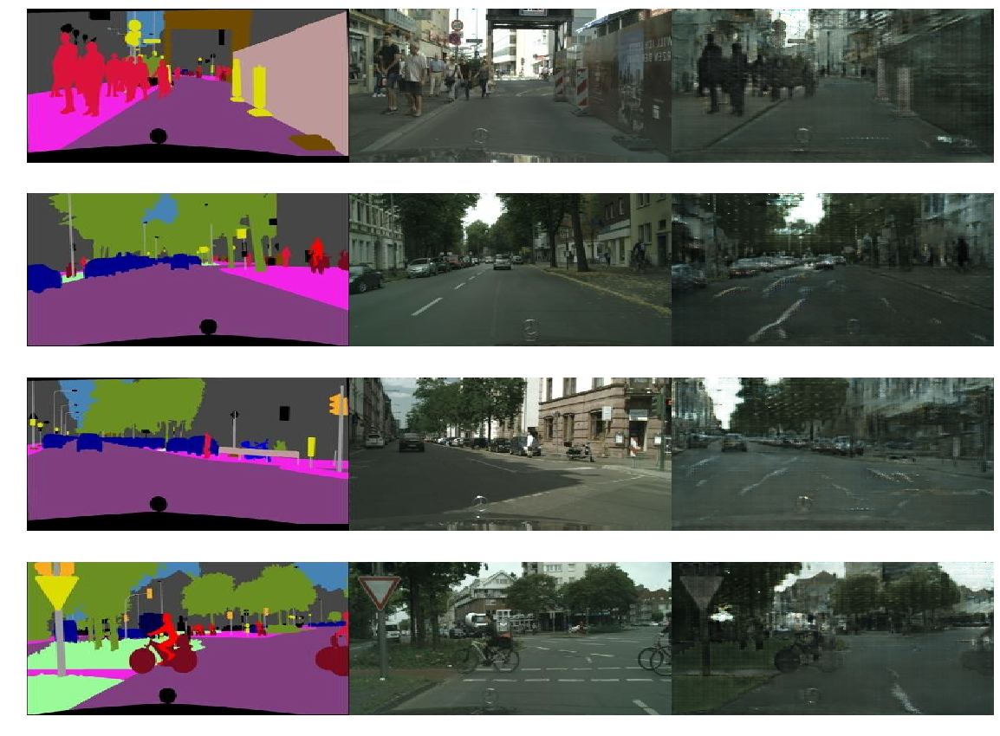

Batch 3


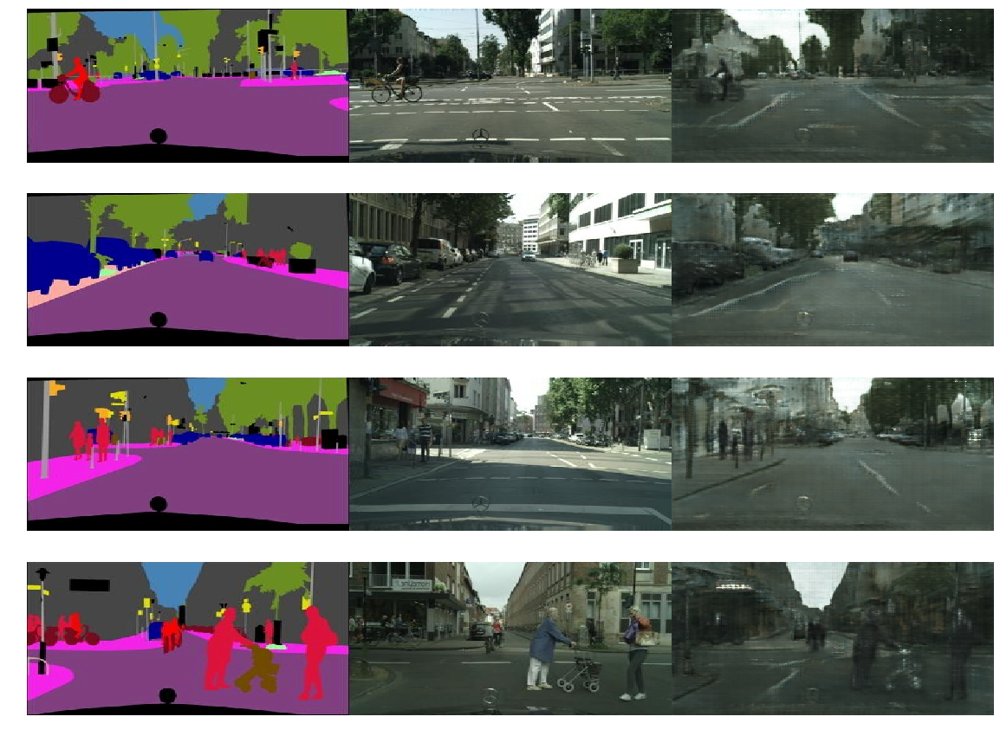

In [0]:
for i, (y,x) in enumerate(Test_loader):
    xtest, ytest = x.to(device), y.to(device)
    ytesthat = G(xtest)
    xtest = xtest.detach().cpu().numpy().transpose((0,2,3,1))
    ytest = ytest.detach().cpu().numpy().transpose((0,2,3,1))
    ytesthat = ytesthat.detach().cpu().numpy().transpose((0,2,3,1))
    print("Batch {}".format(i))
    plt.figure(figsize=(20,15))
    for k in range(4):
        plt.subplot(4,1,k+1)
        plt.imshow(0.5+0.5*np.concatenate((xtest[k], ytest[k], ytesthat[k]),axis=1))
        plt.axis('tight')
        plt.axis('off')
    plt.show()
    if (i>2):
      break;

In [0]:
a